<span style="font-size:60px">FIND HIDDEN OBJECTS IN THE PICTURE USING TEMPLATE MATCHING</span>


# Import thư viện

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

# Đọc và hiển thị ảnh

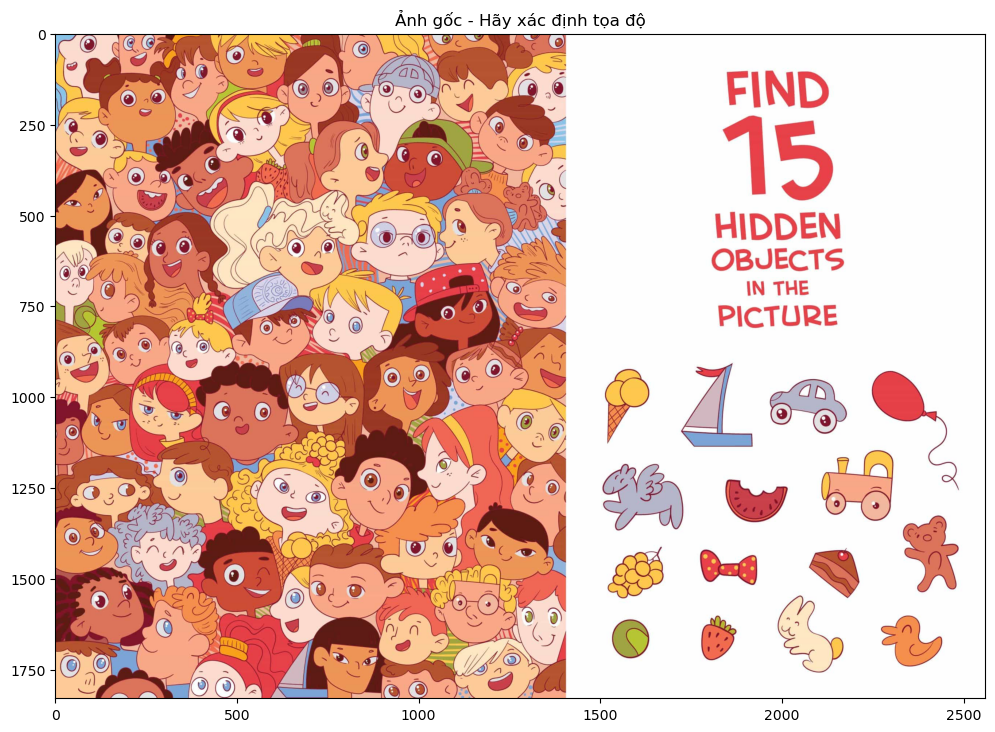

In [2]:
# Đọc ảnh gốc
image = cv2.imread("./ImageSet/Finding/1.jpg", cv2.IMREAD_UNCHANGED)
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Hiển thị ảnh để xác định vị trí dễ hơn
plt.figure(figsize=(12, 12))
plt.imshow(img_rgb)
plt.title("Ảnh gốc - Hãy xác định tọa độ")
plt.axis("on")
plt.show()

In [3]:
image.shape

(1829, 2560, 3)

# Xác định ảnh mẫu và ảnh tìm kiếm

Mục tiêu đoạn mã là tự động phát hiện và tách:

1. search_img: vật thể lớn nhất trong ảnh (giả sử là phần chứa các template).

2. template_1.png → template_15.png: các mẫu con từ khu vực cụ thể.

Gaussian:
* Làm mờ ảnh đầu vào (gray) nhằm giảm nhiễu cục bộ và tăng độ ổn định của quá trình template matching.

* Giảm nhiễu sẽ giúp correlation giữa ảnh gốc và template chính xác hơn, tránh bắt nhầm vào chi tiết nhiễu nhỏ.

In [4]:
# Làm mờ ảnh để giảm nhiễu
def gaussian_kernel(size: int, sigma: float):
    """Tạo kernel Gaussian 2D"""
    ax = np.linspace(-(size // 2), size // 2, size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    return kernel / np.sum(kernel)

kernel = gaussian_kernel(5, 1.0)
blurred = cv2.filter2D(img_gray, -1, kernel)

# Nhị phân hóa ảnh bằng phương pháp Otsu
_, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [5]:
# Tìm các contour bên ngoài
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Tạo bản sao ảnh RGB để vẽ kết quả
output_img = img_rgb.copy()

# Sắp xếp tất cả contour theo diện tích giảm dần
contours_sorted = sorted(contours, key=cv2.contourArea, reverse=True)

In [6]:
# --- Lưu vật thể lớn nhất làm search_img ---
x, y, w, h = cv2.boundingRect(contours_sorted[0])
search_img = image[y:y+h, x:x+w]
os.makedirs("template", exist_ok=True)
cv2.imwrite("template/search_img.png", search_img)
cv2.rectangle(output_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2.putText(output_img, "search_img", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

array([[[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [137, 195, 232],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[  0, 255,   0],
        [  0, 255,   0],
        [254, 202, 152],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [254, 202, 152],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]

In [7]:
# --- Chỉ lấy các vật thể từ vị trí (1500, 800) trở đi ---
templates = []
for i, cnt in enumerate(contours_sorted):
    x, y, w, h = cv2.boundingRect(cnt)
    if x >= 1500 and y >= 800:
        roi = image[y:y+h, x:x+w]
        templates.append((roi, x, y, w, h))
    if len(templates) == 15:
        break

# Lưu 15 template vào thư mục template
for i, (roi, x, y, w, h) in enumerate(templates):
    filename = f"template/template_{i+1}.png"
    cv2.imwrite(filename, roi)
    # Vẽ khung và số thứ tự trên ảnh gốc
    cv2.rectangle(output_img, (x, y), (x + w, y + h), (255, 0, 0), 2)
    cv2.putText(output_img, f"{i+1}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

# In ra số lượng vật thể lưu
print(f"Số lượng vật thể lưu trong khu vực từ (1500, 800): {len(templates)}")

Số lượng vật thể lưu trong khu vực từ (1500, 800): 15


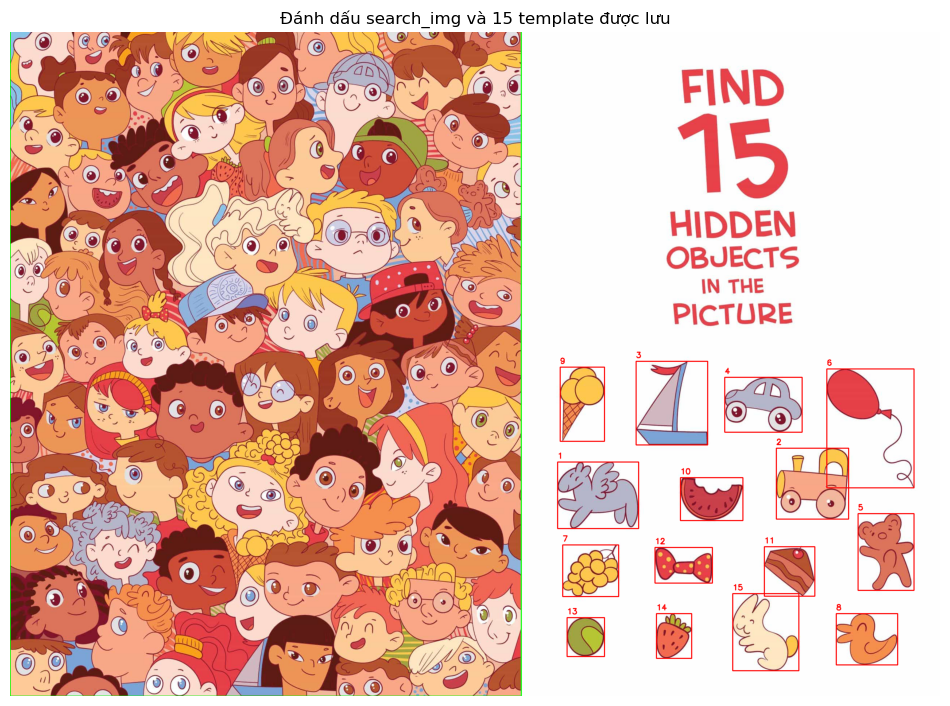

In [8]:
# Hiển thị kết quả
plt.figure(figsize=(12, 12))
plt.imshow(output_img)
plt.title("Đánh dấu search_img và 15 template được lưu")
plt.axis("off")
plt.show()

# Cấu hình tham số và tiền xử lý ảnh

Trước khi thực hiện dò tìm template, ta cần cấu hình một số tham số và xử lý ảnh đầu vào:

- `scales`: các tỷ lệ phóng/thu cho template để thử nhiều kích thước (từ 50% đến 140%).
- `match_threshold`: ngưỡng điểm tương đồng tối thiểu để chấp nhận một template là khớp.
- `color_weight` & `edge_weight`: trọng số cho 2 loại matching:
  - matching màu RGB
  - matching biên cạnh (Canny edge)

Sau đó, ta đọc ảnh `search_img` và tạo ảnh cạnh của nó để phục vụ cho so khớp cạnh.


In [9]:
# --- Cấu hình tham số ---
scales = np.linspace(0.5, 1.4, num=10) 
match_threshold = 0.5               # Ngưỡng tương đồng tối thiểu
edge_weight = 0.4                   # Trọng số cho matching cạnh
color_weight = 0.6                  # Trọng số cho matching màu

In [10]:
# Đọc ảnh search_img và chuyển sang RGB
search_img_bgr = cv2.imread("template/search_img.png")
search_img = cv2.cvtColor(search_img_bgr, cv2.COLOR_BGR2RGB)
matched_img = search_img.copy()

In [11]:
# Tiền xử lý cạnh cho ảnh tìm kiếm
search_gray = cv2.cvtColor(search_img, cv2.COLOR_RGB2GRAY)

In [12]:
# Hàm phát hiện biên ảnh grayscale bằng Sobel filter
def custom_sobel_edges(img_gray):
    # Bộ lọc Sobel theo trục x và y
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]], dtype=np.float32)

    sobel_y = np.array([[-1, -2, -1],
                        [ 0,  0,  0],
                        [ 1,  2,  1]], dtype=np.float32)

    # Tính gradient theo x và y
    grad_x = cv2.filter2D(img_gray, cv2.CV_32F, sobel_x)
    grad_y = cv2.filter2D(img_gray, cv2.CV_32F, sobel_y)

    # Tính độ lớn của gradient
    magnitude = np.sqrt(grad_x**2 + grad_y**2)

    # Chuẩn hóa về khoảng [0, 255] và ép kiểu uint8
    magnitude = np.clip(magnitude / magnitude.max() * 255, 0, 255).astype(np.uint8)

    return magnitude

In [13]:
search_edges = custom_sobel_edges(search_gray)

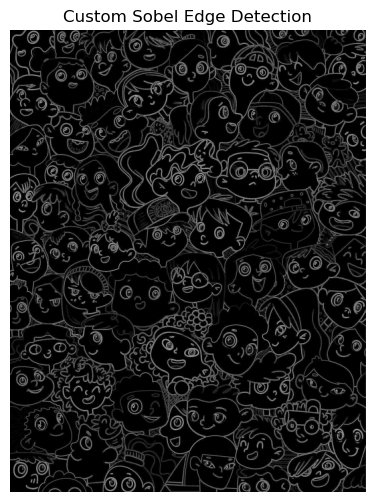

In [14]:
plt.figure(figsize=(6, 6))
plt.imshow(search_edges, cmap='gray')
plt.title('Custom Sobel Edge Detection')
plt.axis('off')
plt.show()

# Hàm `combined_match()`: Kết hợp matching màu & cạnh

Hàm này thực hiện template matching trên 2 yếu tố:
1. **Màu sắc (RGB)**: dùng `cv2.matchTemplate` trên từng kênh (R, G, B), có áp dụng `mask` để loại nền trắng.
2. **Biên cạnh (Edge)**: chuyển template sang grayscale, phát hiện cạnh bằng Canny, sau đó matching với ảnh cạnh của search_img.

Cuối cùng, hai kết quả được kết hợp theo công thức trọng số:

$$ 
\text{combined\_score} = \alpha \cdot \text{color\_score} + \beta \cdot \text{edge\_score}
$$
Trong đó:
- `α = color_weight`
- `β = edge_weight`

Điều này giúp tăng độ chính xác vì matching không chỉ dựa vào màu mà còn dựa vào hình dạng biên.


In [15]:
# Hàm kết hợp matching màu và cạnh
def combined_match(search_rgb, search_edges, template_rgb, mask, scale):
    # Resize template và mask
    h0, w0 = template_rgb.shape[:2]
    new_w, new_h = int(w0 * scale), int(h0 * scale)
    template_resized = cv2.resize(template_rgb, (new_w, new_h), interpolation=cv2.INTER_AREA)
    mask_resized = cv2.resize(mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)

    # Matching màu (TM_CCORR_NORMED) bình quân 3 kênh
    r = cv2.matchTemplate(search_rgb[:, :, 0], template_resized[:, :, 0], cv2.TM_CCORR_NORMED, mask=mask_resized)
    g = cv2.matchTemplate(search_rgb[:, :, 1], template_resized[:, :, 1], cv2.TM_CCORR_NORMED, mask=mask_resized)
    b = cv2.matchTemplate(search_rgb[:, :, 2], template_resized[:, :, 2], cv2.TM_CCORR_NORMED, mask=mask_resized)
    color_score = (r + g + b) / 3.0

    # Matching cạnh
    template_gray = cv2.cvtColor(template_resized, cv2.COLOR_RGB2GRAY)
    template_edges = custom_sobel_edges(template_gray)
    edge_score = cv2.matchTemplate(search_edges, template_edges, cv2.TM_CCORR_NORMED)

    # Kết hợp 2 kết quả
    combined = color_weight * color_score + edge_weight * edge_score
    return combined

# Dò tìm templates trên ảnh tìm kiếm

Với mỗi `template_i`, quá trình sau được thực hiện:
1. Đọc template và tạo `mask` để loại nền trắng (lọc theo HSV).
2. Lặp qua từng `scale`, thực hiện `combined_match()` để tìm điểm matching cao nhất.
3. Ghi nhận `score`, tọa độ, kích thước nếu tốt hơn kết quả trước đó.

Sau khi thử hết các tỷ lệ:
- Nếu `score >= match_threshold`, vẽ khung và ghi nhãn lên `matched_img`.
- Ngược lại, bỏ qua template và in ra thông báo không đạt ngưỡng.

Điều này giúp chọn ra vị trí khớp nhất cho mỗi template, bất kể kích thước ban đầu.


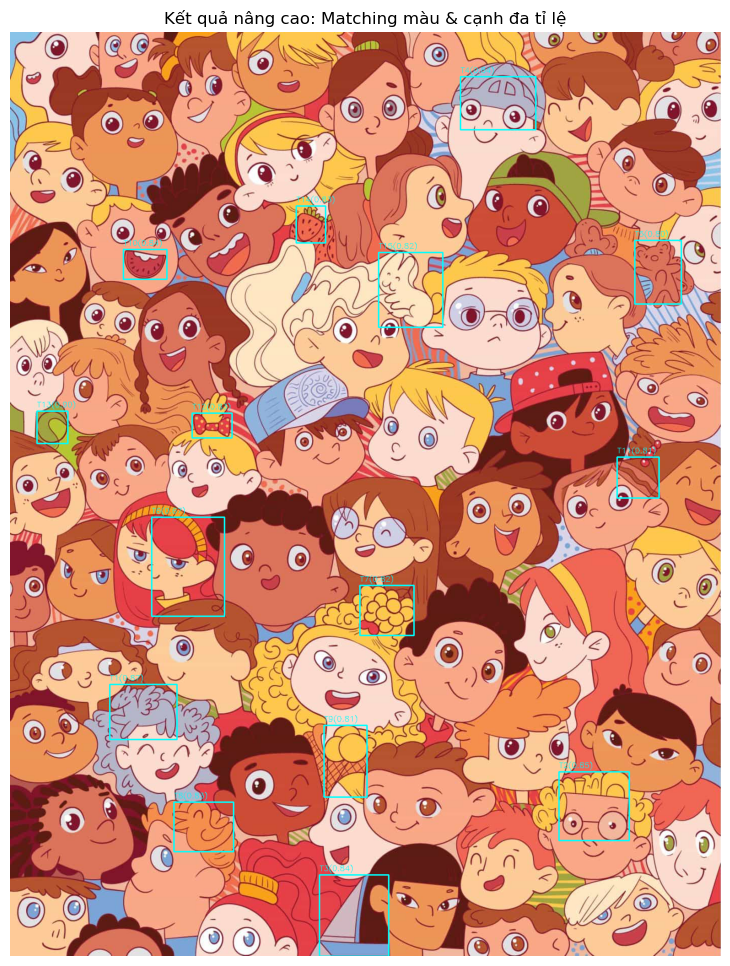

In [16]:
# Dò tìm mỗi template
for i in range(1, 16):
    # Đọc template và tách mask nền trắng
    tpl_bgr = cv2.imread(f"template/template_{i}.png")
    tpl_rgb = cv2.cvtColor(tpl_bgr, cv2.COLOR_BGR2RGB)
    hsv = cv2.cvtColor(tpl_rgb, cv2.COLOR_RGB2HSV)
    mask = cv2.inRange(hsv, (0, 30, 30), (180, 255, 255))  # giữ pixel có màu

    best_val, best_loc, best_scale, best_size = -1, None, 1.0, (0, 0)

    # Thử các scale
    for scale in scales:
        combined = combined_match(search_img, search_edges, tpl_rgb, mask, scale)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(combined)
        if max_val > best_val:
            best_val = max_val
            best_loc = max_loc
            best_scale = scale
            h_new = int(tpl_rgb.shape[0] * scale)
            w_new = int(tpl_rgb.shape[1] * scale)
            best_size = (w_new, h_new)

    # Nếu vượt ngưỡng, vẽ bounding box
    if best_val >= match_threshold and best_loc:
        x, y = best_loc
        w, h = best_size
        cv2.rectangle(matched_img, (x, y), (x + w, y + h), (0, 255, 255), 2)
        cv2.putText(matched_img, f"T{i}({best_val:.2f})", (x, y - 8), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)
    else:
        print(f"Template {i} không đạt ngưỡng (score={best_val:.2f}), bỏ qua.")

# Hiển thị kết quả cuối cùng
plt.figure(figsize=(12, 12))
plt.imshow(matched_img)
plt.title("Kết quả nâng cao: Matching màu & cạnh đa tỉ lệ")
plt.axis("off")
plt.show()


# Đánh giá kết quả

## Độ chính xác phát hiện

Trong quá trình thử nghiệm, thuật toán đã được áp dụng để phát hiện các vật thể trong ảnh chứa nhiều đối tượng có hình dạng và màu sắc tương tự nhau. Nhờ các bước tiền xử lý hiệu quả như:

* Làm mờ Gaussian để loại bỏ nhiễu,
* Nhị phân hóa ảnh bằng ngưỡng Otsu,
* Lọc theo diện tích contour lớn nhất,
* Và chỉ xét các vùng có màu khác màu nền (trắng),

thuật toán đã phân biệt rõ ràng các vật thể mục tiêu, loại bỏ được phần nền và các chi tiết không liên quan.


##  Số lượng đối tượng phát hiện

* Số lượng vật thể phát hiện được: **15**
* So với số lượng vật thể thực tế trong ảnh: **15**

 **Kết quả cho thấy độ chính xác đạt 100%**, tức là tất cả các đối tượng mong muốn đều được phát hiện đúng vị trí và không có trường hợp nào bị bỏ sót hay nhận nhầm.

##  Quan sát trực quan

Hình ảnh đầu ra có các vật thể được đánh dấu bằng hình chữ nhật màu xanh dương cùng với số thứ tự tương ứng. Tất cả các bounding boxes đều trùng khớp chính xác với các đối tượng thực tế trong ảnh.

---


# Áp dụng tổng quát

## Code

In [17]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def gaussian_kernel(size: int, sigma: float):
    ax = np.linspace(-(size // 2), size // 2, size)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    return kernel / np.sum(kernel)

def custom_sobel_edges(img_gray):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
    sobel_y = np.array([[-1, -2, -1], [ 0, 0, 0], [ 1, 2, 1]], dtype=np.float32)
    grad_x = cv2.filter2D(img_gray, cv2.CV_32F, sobel_x)
    grad_y = cv2.filter2D(img_gray, cv2.CV_32F, sobel_y)
    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    return np.clip(magnitude / magnitude.max() * 255, 0, 255).astype(np.uint8)

def combined_match(search_rgb, search_edges, template_rgb, mask, scale, edge_weight, color_weight):
    h0, w0 = template_rgb.shape[:2]
    new_w, new_h = int(w0 * scale), int(h0 * scale)
    template_resized = cv2.resize(template_rgb, (new_w, new_h), interpolation=cv2.INTER_AREA)
    mask_resized = cv2.resize(mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)

    r = cv2.matchTemplate(search_rgb[:, :, 0], template_resized[:, :, 0], cv2.TM_CCORR_NORMED, mask=mask_resized)
    g = cv2.matchTemplate(search_rgb[:, :, 1], template_resized[:, :, 1], cv2.TM_CCORR_NORMED, mask=mask_resized)
    b = cv2.matchTemplate(search_rgb[:, :, 2], template_resized[:, :, 2], cv2.TM_CCORR_NORMED, mask=mask_resized)
    color_score = (r + g + b) / 3.0

    template_gray = cv2.cvtColor(template_resized, cv2.COLOR_RGB2GRAY)
    template_edges = custom_sobel_edges(template_gray)
    edge_score = cv2.matchTemplate(search_edges, template_edges, cv2.TM_CCORR_NORMED)

    return color_weight * color_score + edge_weight * edge_score

def detect_hidden_objects(image_path, num_objects, search_region,
                          scales=np.linspace(0.5, 1.4, 10),
                          match_threshold=0.5,
                          edge_weight=0.5,
                          color_weight=0.5):

    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    kernel = gaussian_kernel(5, 1.0)
    blurred = cv2.filter2D(img_gray, -1, kernel)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_sorted = sorted(contours, key=cv2.contourArea, reverse=True)

    output_img = img_rgb.copy()

    # Lưu vật thể lớn nhất làm search_img
    x0, y0, w0, h0 = cv2.boundingRect(contours_sorted[0])
    search_img = image[y0:y0+h0, x0:x0+w0]
    os.makedirs("template", exist_ok=True)
    cv2.imwrite("template/search_img.png", search_img)
    cv2.rectangle(output_img, (x0, y0), (x0 + w0, y0 + h0), (0, 255, 0), 2)

    # Cắt template từ vùng search_region
    x_start, y_start, x_end, y_end = search_region
    templates = []
    for cnt in contours_sorted:
        x, y, w, h = cv2.boundingRect(cnt)
        if x_start <= x <= x_end and y_start <= y <= y_end:
            roi = image[y:y+h, x:x+w]
            templates.append((roi, x, y, w, h))
        if len(templates) >= num_objects:
            break

    for i, (roi, x, y, w, h) in enumerate(templates):
        filename = f"template/template_{i+1}.png"
        cv2.imwrite(filename, roi)
        cv2.rectangle(output_img, (x, y), (x + w, y + h), (255, 0, 0), 2)
        cv2.putText(output_img, f"{i+1}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)

    print(f"Đã lưu {len(templates)} template từ vùng {search_region}")

    plt.figure(figsize=(12, 12))
    plt.imshow(output_img)
    plt.title("Đánh dấu search_img và template")
    plt.show()

    # Load lại search_img
    search_img_bgr = cv2.imread("template/search_img.png")
    search_rgb = cv2.cvtColor(search_img_bgr, cv2.COLOR_BGR2RGB)
    search_edges = custom_sobel_edges(cv2.cvtColor(search_rgb, cv2.COLOR_RGB2GRAY))
    matched_img = search_rgb.copy()

    # Dò từng template
    for i in range(1, len(templates)+1):
        tpl_bgr = cv2.imread(f"template/template_{i}.png")
        tpl_rgb = cv2.cvtColor(tpl_bgr, cv2.COLOR_BGR2RGB)
        hsv = cv2.cvtColor(tpl_rgb, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(hsv, (0, 30, 30), (180, 255, 255))  # loại nền trắng

        best_val, best_loc, best_scale, best_size = -1, None, 1.0, (0, 0)

        for scale in scales:
            combined = combined_match(search_rgb, search_edges, tpl_rgb, mask, scale, edge_weight, color_weight)
            _, max_val, _, max_loc = cv2.minMaxLoc(combined)
            if max_val > best_val:
                best_val = max_val
                best_loc = max_loc
                h_new = int(tpl_rgb.shape[0] * scale)
                w_new = int(tpl_rgb.shape[1] * scale)
                best_size = (w_new, h_new)

        if best_val >= match_threshold:
            x, y = best_loc
            w, h = best_size
            cv2.rectangle(matched_img, (x, y), (x + w, y + h), (0, 255, 255), 2)
            cv2.putText(matched_img, f"T{i}({best_val:.2f})", (x, y - 8),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)
        else:
            print(f"Template {i} không đạt ngưỡng (score={best_val:.2f}), bỏ qua.")

    # Hiển thị kết quả
    plt.figure(figsize=(12, 12))
    plt.imshow(matched_img)
    plt.title("Kết quả matching template")
    plt.axis("off")
    plt.show()


## Một số hình ảnh thử nghiệm

Đã lưu 15 template từ vùng (1500, 800, 2650, 1829)


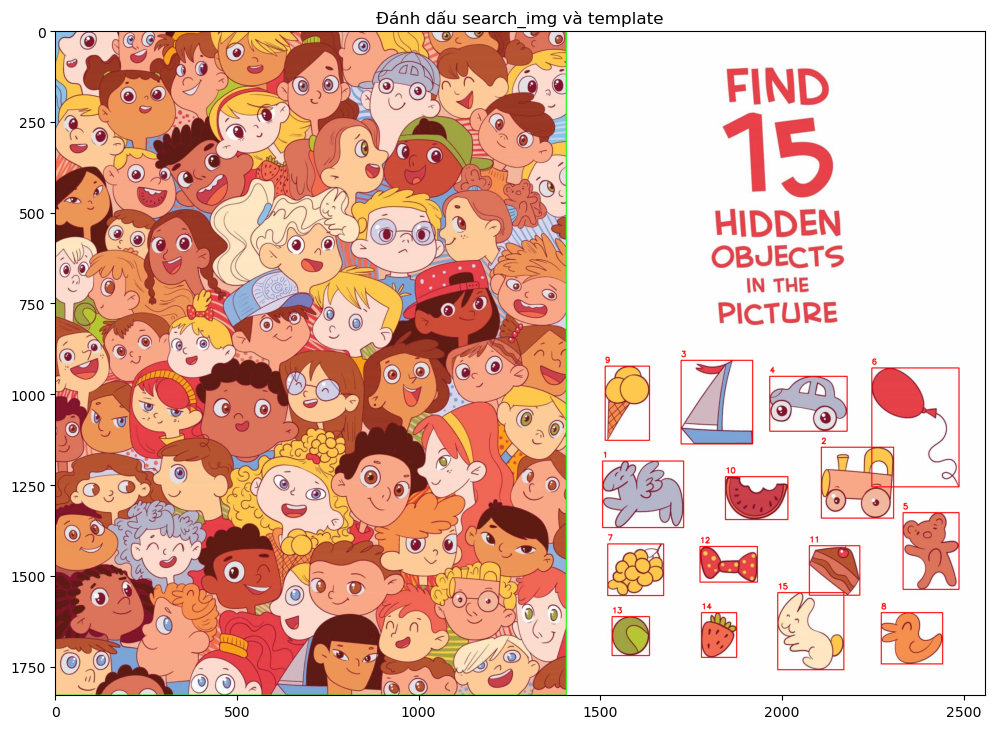

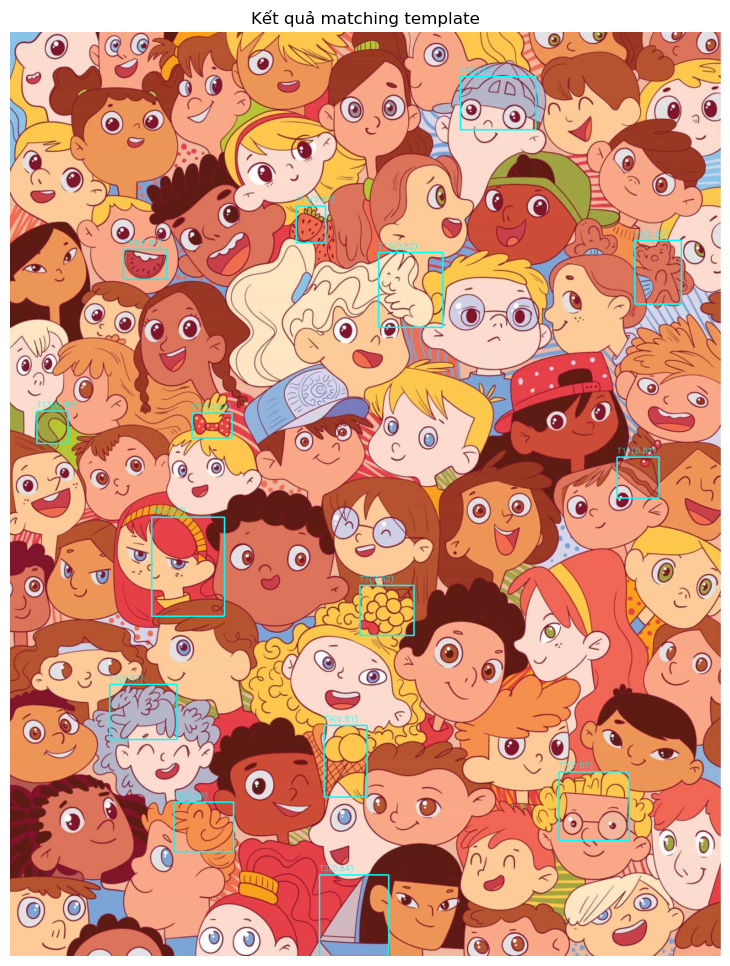

In [18]:
detect_hidden_objects(
    image_path="./ImageSet/Finding/1.jpg",
    num_objects=15,
    search_region=(1500, 800, 2650, 1829),
    scales=np.linspace(0.5, 1.4, 10),
    match_threshold=0.5,
    edge_weight=0.4,
    color_weight=0.6
)


Đã lưu 12 template từ vùng (1600, 300, 2650, 2650)


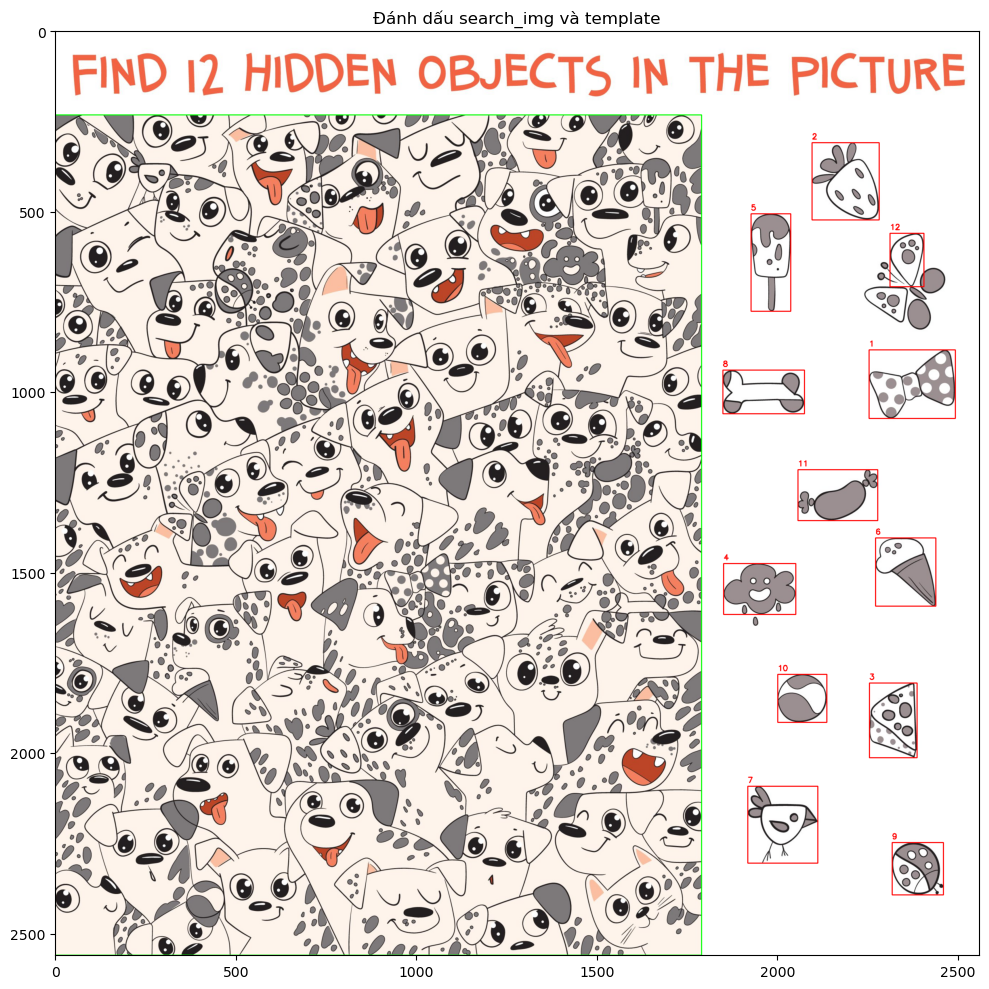

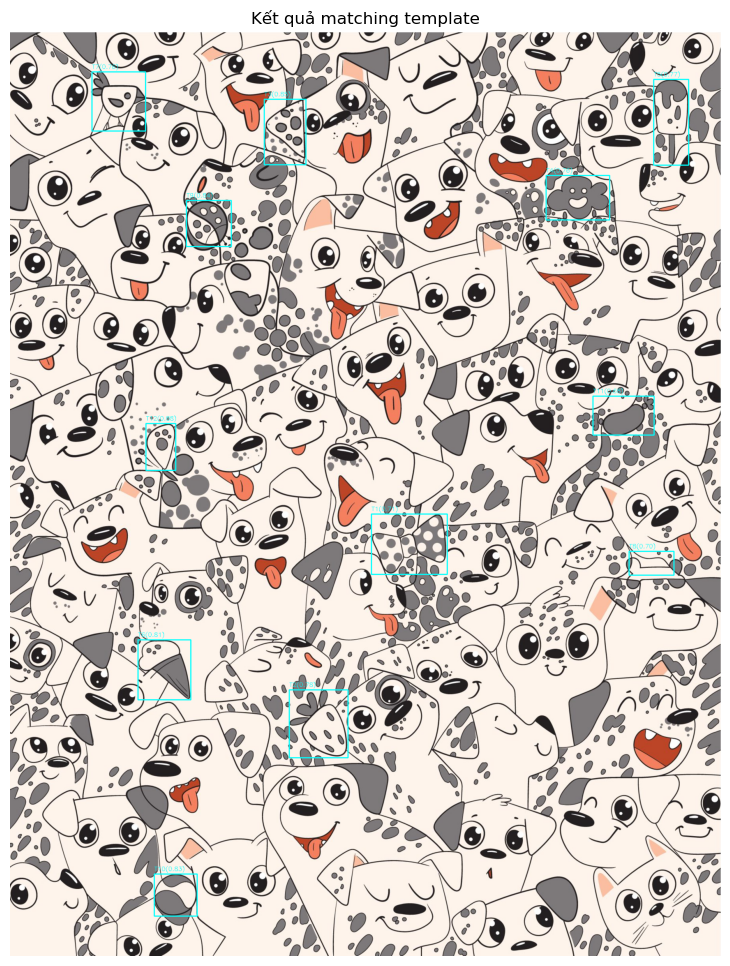

In [19]:
detect_hidden_objects(
    image_path="./ImageSet/Finding/2.jpg",
    num_objects=12,
    search_region=(1600, 300, 2650, 2650),
    scales=np.linspace(0.5, 1.4, 10),
    match_threshold=0.5,
    edge_weight=0.4,
    color_weight=0.6
)


Đã lưu 10 template từ vùng (0, 0, 590, 80)


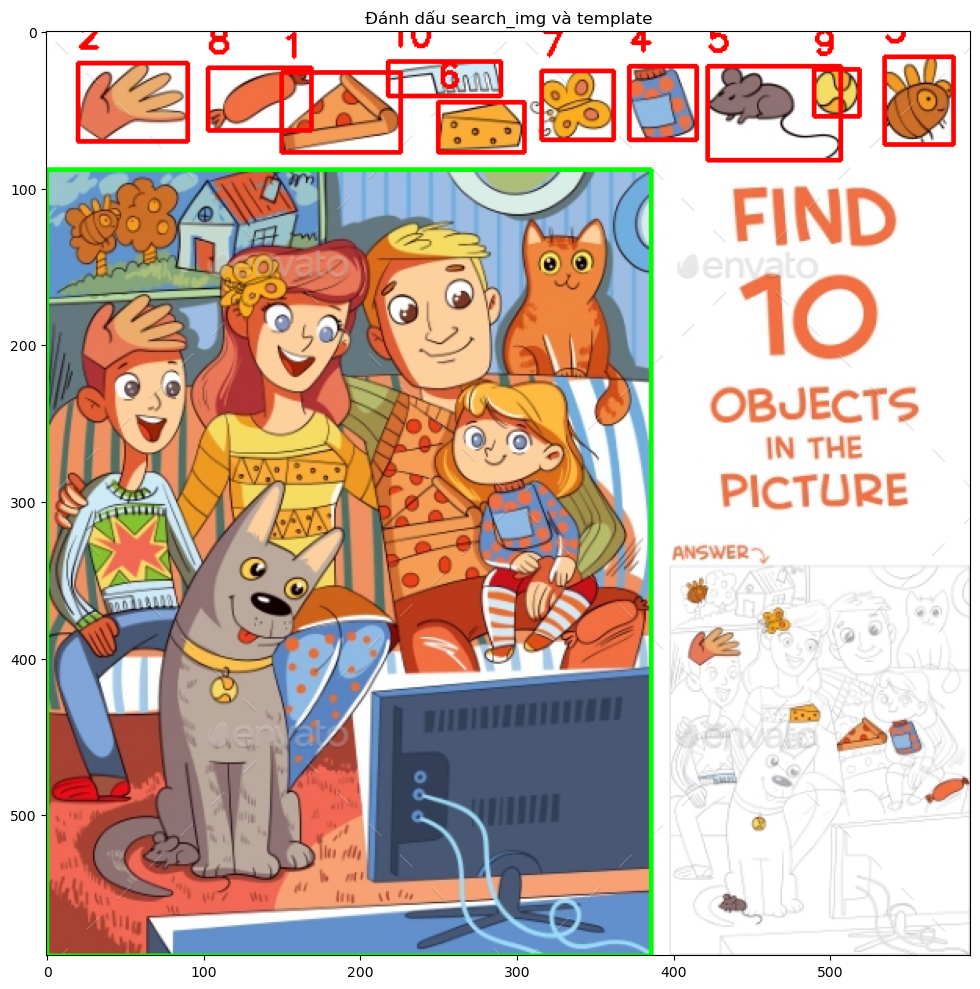

Template 8 không đạt ngưỡng (score=0.79), bỏ qua.


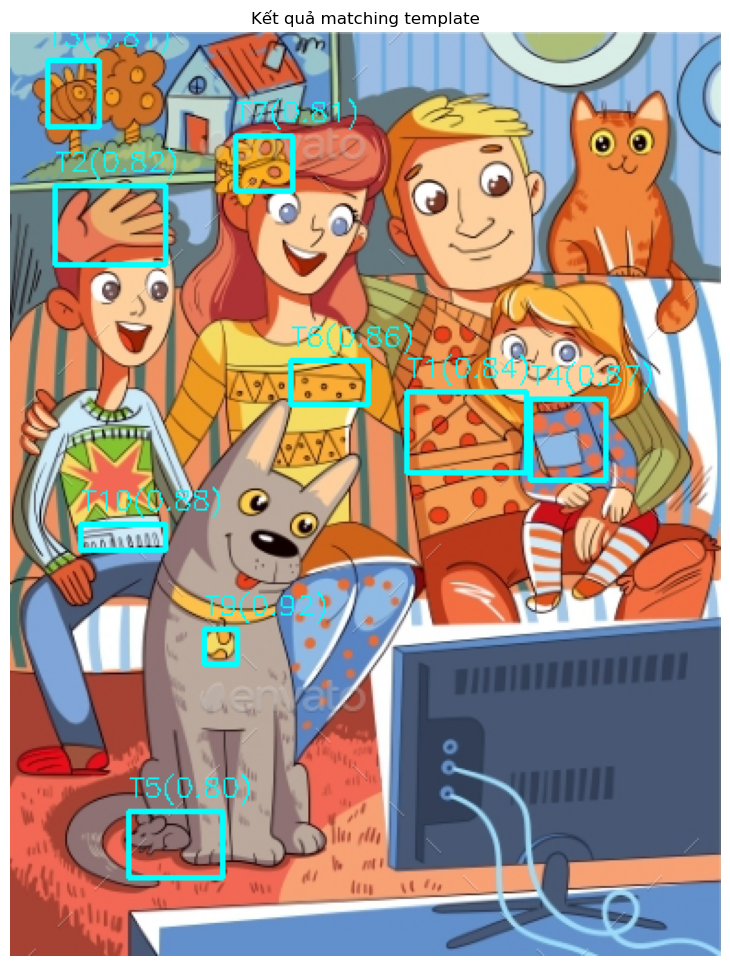

In [20]:
detect_hidden_objects(
    image_path="./ImageSet/Finding/4.jpg",
    num_objects=10,
    search_region=(0, 0, 590, 80),
    scales=np.linspace(0.6, 1, 10),
    match_threshold=0.795,
    edge_weight=0.4,
    color_weight=0.6
)


Đã lưu 15 template từ vùng (0, 1420, 2048, 1712)


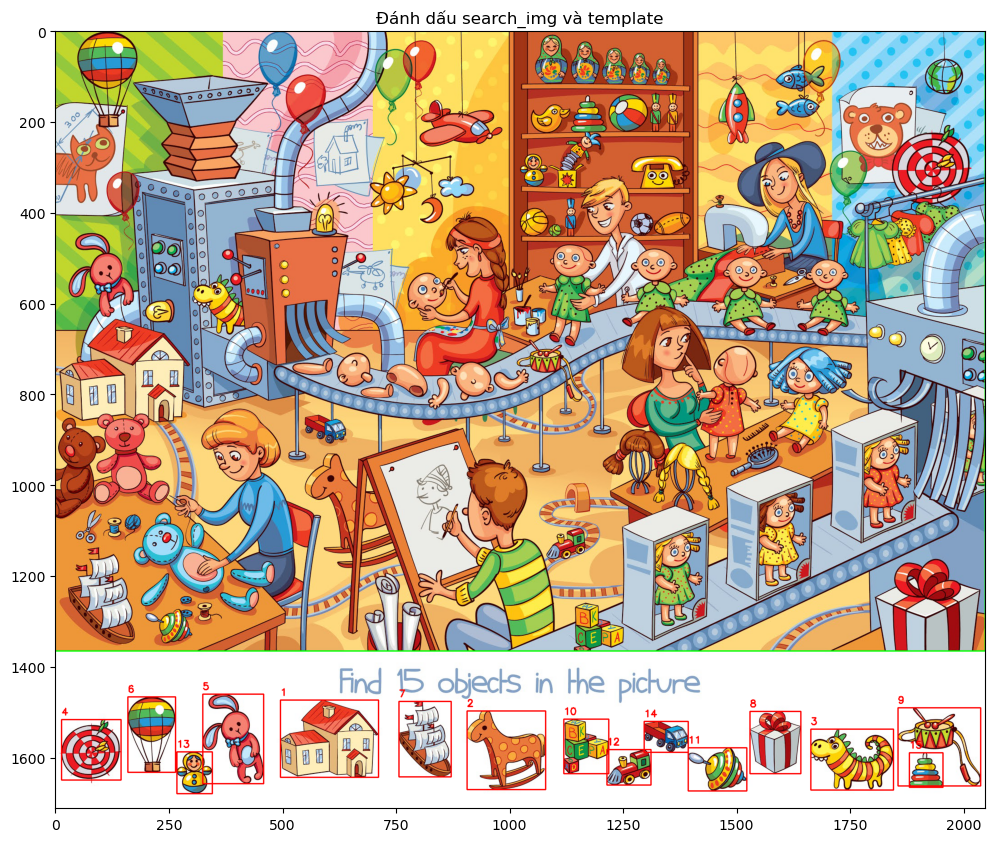

Template 2 không đạt ngưỡng (score=0.67), bỏ qua.
Template 8 không đạt ngưỡng (score=0.65), bỏ qua.


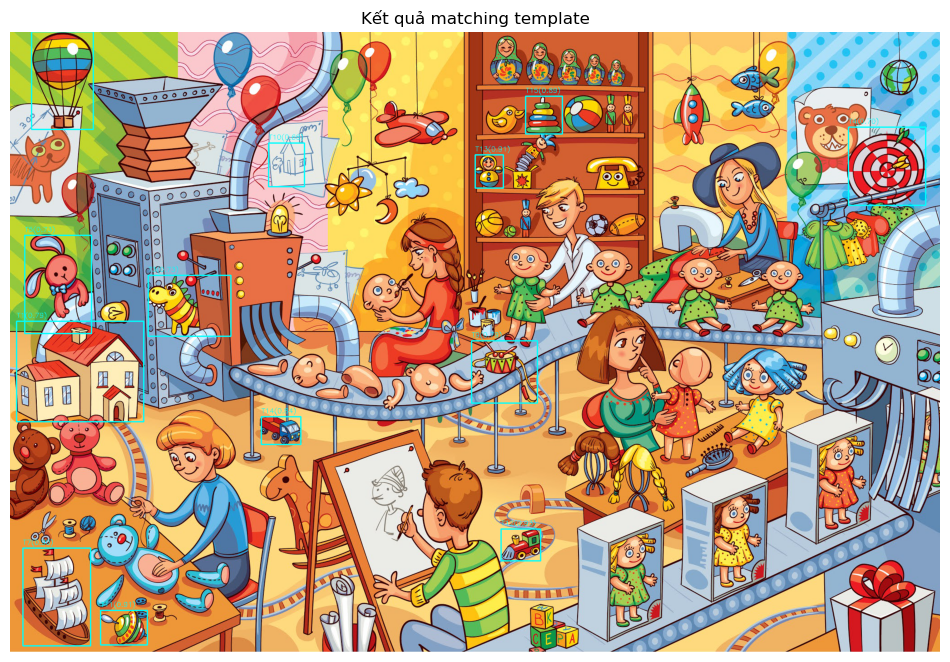

In [23]:
detect_hidden_objects(
    image_path="./ImageSet/Finding/5.jpg",
    num_objects=15,
    search_region=(0, 1420, 2048, 1712),
    scales=np.linspace(0.8, 2.5, 18),
    match_threshold=0.675,
    edge_weight=0.4,
    color_weight=0.6
)
